In [1]:
%load_ext autoreload
%autoreload 2

import os

# os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".9"
os.environ["WANDB_NOTEBOOK_NAME"] = "ssilvae.ipynb"

from ml_collections import config_dict
import jax.random as random
import jax.numpy as jnp

jnp.log(jnp.exp(1) - 1.0)
# TODO: figure out why we get CUDA failures this ^ isn't here. 

from absl import logging

from src.utils.training import setup_model, get_dataset_splits, train_loop

# set save plot face color to be white
import matplotlib.pyplot as plt
plt.rcParams["savefig.facecolor"] = "white"

/homes/jua23/.virtualenvs/inv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-07-07 15:26:55.438649: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/homes/jua23/.virtualenvs/inv/lib/python3.9/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
RUN_EXTRA = False

In [3]:
logging.set_verbosity(logging.INFO)

In [4]:
rng = random.PRNGKey(0)
data_rng, model_rng = random.split(rng)

In [5]:
from experiments.configs.ssilvae_mnist import get_config

config = get_config("45,50000,7501,1")

config

angle: 45
batch_size: 512
batch_size_eval: 64
dataset: MNIST
eval_every: 500
hais:
  num_chains: 300
  num_leapfrog_steps: 2
  num_steps: 100
  step_size: 0.008
iwlb:
  num_samples: 100
learning_rate: !!python/tuple
- 0.0003
- 0.0001
lr_schedule: !!python/tuple
- !!python/object:ml_collections.config_dict.config_dict.ConfigDict
  _convert_dict: true
  _fields:
    decay_steps: 7501
    end_value: 0.0003
    peak_value: 0.0029999999999999996
    warmup_steps: 750
  _locked: false
  _type_safe: true
- !!python/object:ml_collections.config_dict.config_dict.ConfigDict
  _convert_dict: true
  _fields:
    decay_steps: 7501
    end_value: 0.0001
    peak_value: 0.001
    warmup_steps: 750
  _locked: false
  _type_safe: true
lr_schedule_halfs: !!python/tuple
- first
- second
lr_schedule_name: !!python/tuple
- warmup_cosine_decay_schedule
- warmup_cosine_decay_schedule
model:
  Xhat_given_Z:
    conv_dims: !!python/tuple
    - 256
    - 128
    - 64
    dense_dims: &id001 !!python/tuple
    - 

In [6]:
train_ds, val_ds, _ = get_dataset_splits(config, data_rng, config.batch_size, config.batch_size)

INFO:absl:Initializing train dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Fields info.[citation, splits, supervised_keys, module_name] from disk and from code do not match. Keeping the one from code.
INFO:absl:Constructing tf.data.Dataset mnist for split _EvenSplit(split='train[10000:60000]', index=0, count=1, drop_remainder=False), from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Features before preprocessing: {'image': 'uint8[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}


INFO:absl:Features after op ValueRange(vmin=-1, vmax=1, in_min=0, in_max=255.0, clip_values=False, key='image', key_result=None):
{'image': 'float32[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op RandomRotate(θ_min=-0.7853981633974483, θ_max=0.7853981633974483, fill_mode='nearest', fill_value=-1, key='image', key_result=None, rng_key='rng'):
{'image': 'float32[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op Keep(keys=['image']):
{'image': 'float32[28, 28, 1]'}
INFO:absl:Features after preprocessing: {'image': 'float32[28, 28, 1]'}
INFO:absl:Initializing val dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Fields info.[citation, splits, supervised_keys, module_name] from disk and from code do not match. Keeping the one from code.
INFO:absl:Running validation for 20 steps for MNIST, train[:10000]
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
I

In [7]:
model, state = setup_model(config, model_rng, train_ds)

INFO:absl:Initializing model...
INFO:absl:config.model_name = SSILVAE
INFO:absl:config.model = Xhat_given_Z:
  conv_dims: !!python/tuple
  - 256
  - 128
  - 64
  dense_dims: &id001 !!python/tuple
  - 256
  max_2strides: 2
Z_given_Xhat:
  conv_dims: !!python/tuple
  - 64
  - 128
  - 256
  dense_dims: *id001
  max_2strides: 2
bounds: !!python/tuple
- 0.25
- 0.25
- 3.141592653589793
- 0.25
- 0.25
latent_dim: 16
offset: !!python/tuple
- 0.0
- 0.0
- 0.0
- 0.0
- 0.0
"\u0397_given_X":
  base:
    conv_dims: !!python/tuple []
    dense_dims: &id002 !!python/tuple
    - 64
    - 32
    - 16
    dropout_rate: 0.0
  conditioner:
    dropout_rate: 0.0
    hidden_dims: &id003 !!python/tuple
    - 256
    - 128
  num_bins: 5
  num_layers: 1
  trunk:
    conv_dims: &id004 !!python/tuple
    - 32
    - 64
    - 128
    dense_dims: *id001
    dropout_rate: 0.0
"\u0397_given_Xhat":
  base:
    conv_dims: !!python/tuple []
    dense_dims: *id002
    dropout_rate: 0.0
  conditioner:
    dropout_rate: 0.0


INFO:absl:
+---------------------------------------------------+------------------+---------+-----------+----------+
| Name                                              | Shape            | Size    | Mean      | Std      |
+---------------------------------------------------+------------------+---------+-----------+----------+
| params/p_Xhat_given_Z/conv_1/bias                 | (256,)           | 256     | 0.0       | 0.0      |
| params/p_Xhat_given_Z/conv_1/kernel               | (3, 3, 3, 256)   | 6,912   | 0.000718  | 0.192    |
| params/p_Xhat_given_Z/conv_2/bias                 | (128,)           | 128     | 0.0       | 0.0      |
| params/p_Xhat_given_Z/conv_2/kernel               | (3, 3, 256, 128) | 294,912 | -1.35e-05 | 0.0208   |
| params/p_Xhat_given_Z/conv_3/bias                 | (64,)            | 64      | 0.0       | 0.0      |
| params/p_Xhat_given_Z/conv_3/kernel               | (3, 3, 128, 64)  | 73,728  | -7.74e-05 | 0.0294   |
| params/p_Xhat_given_Z/dense_0/bia

INFO:absl:Setting up datasets...
INFO:absl:Global batch size 512 on 1 hosts results in 512 local batch size. With 1 devices per host (1 devices total), that's a 512 per-device batch size.
INFO:absl:Initializing train dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Fields info.[citation, splits, supervised_keys, module_name] from disk and from code do not match. Keeping the one from code.
INFO:absl:Constructing tf.data.Dataset mnist for split _EvenSplit(split='train[10000:60000]', index=0, count=1, drop_remainder=False), from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Features before preprocessing: {'image': 'uint8[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op ValueRange(vmin=-1, vmax=1, in_min=0, in_max=255.0, clip_values=False, key='image', key_result=None):
{'image': 'float32[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op RandomRotate(θ_min=-0.785398163397

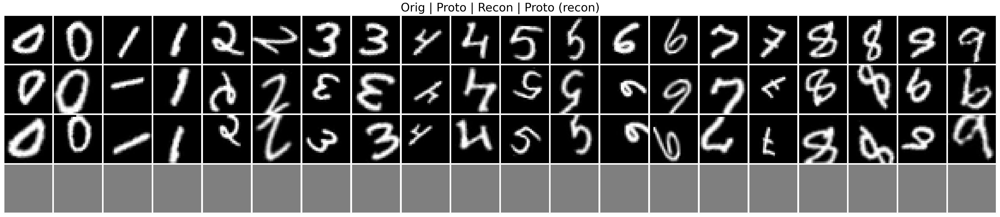

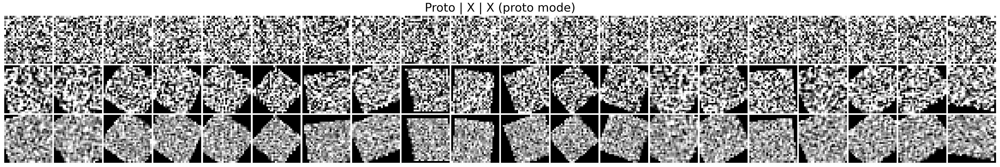

  3%|▎         | 499/15002 [02:16<18:33, 13.03it/s, Trn Loss 1958,	 Trn LL -588.9,	 Val Loss 2280,	 Val LL -910.8]   

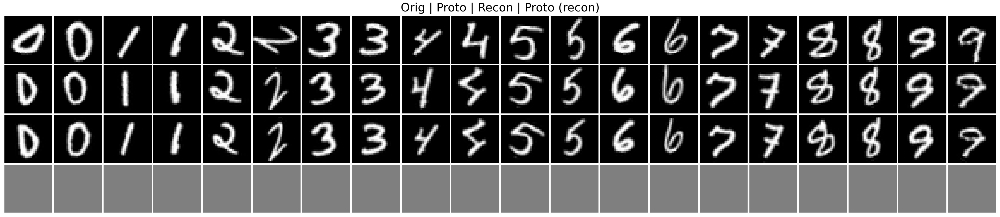

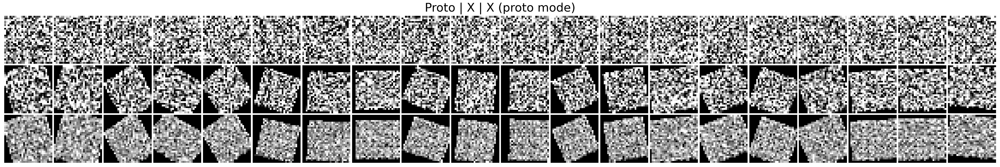

  7%|▋         | 1000/15002 [02:46<11:07, 20.97it/s, Trn Loss 1502,	 Trn LL -140.8,	 Val Loss 1956,	 Val LL -579.1] 

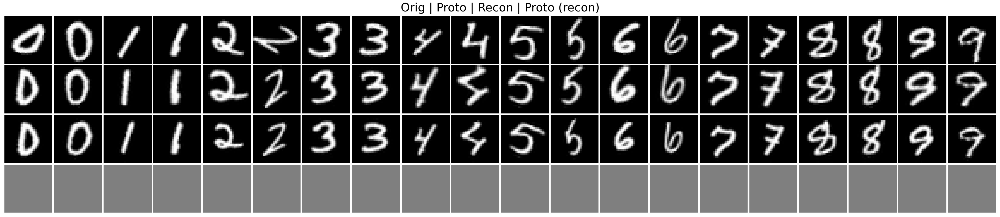

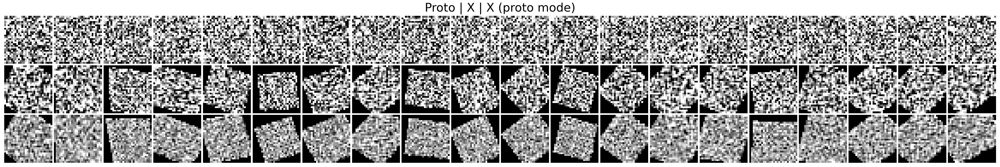

 10%|▉         | 1498/15002 [03:16<09:07, 24.69it/s, Trn Loss 1353,	 Trn LL -22.95,	 Val Loss 1514,	 Val LL -144.3]  

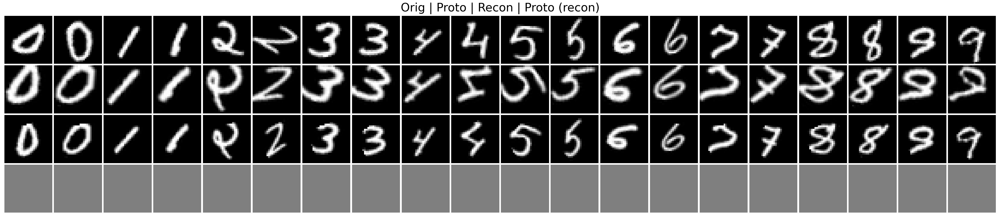

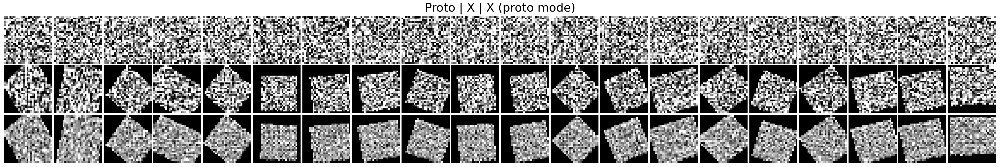

 13%|█▎        | 1999/15002 [03:46<08:24, 25.76it/s, Trn Loss 1335,	 Trn LL 16.59,	 Val Loss 1457,	 Val LL -124.9]    

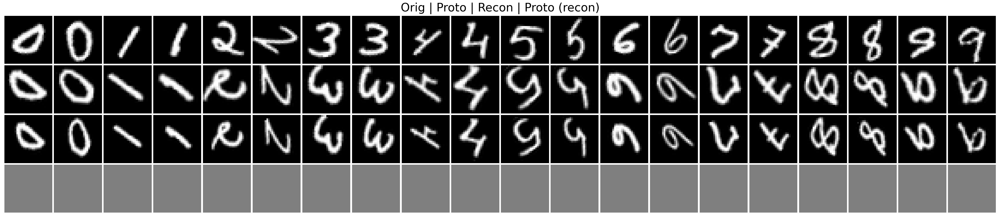

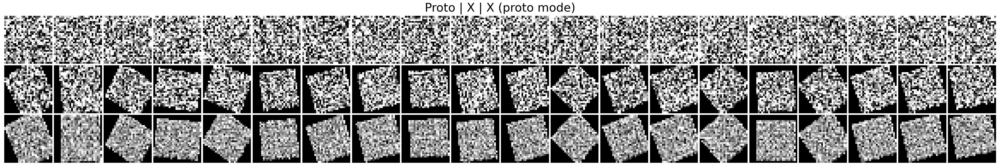

 17%|█▋        | 2500/15002 [04:17<07:37, 27.34it/s, Trn Loss 1278,	 Trn LL 86.24,	 Val Loss 1437,	 Val LL -75.98]   

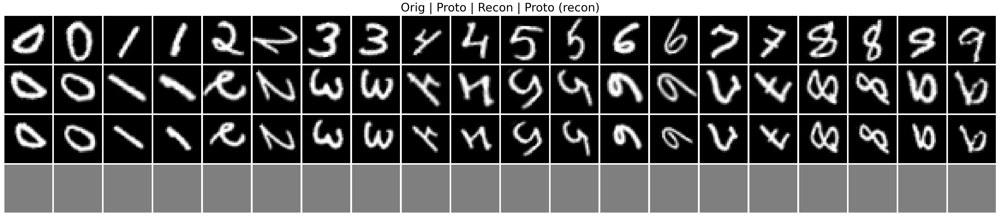

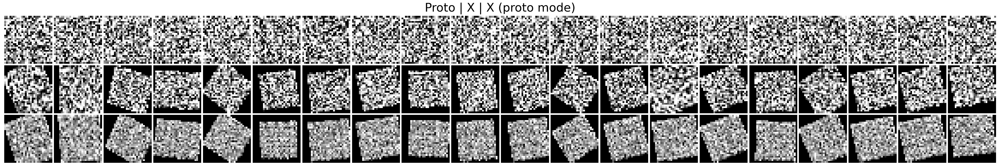

 20%|█▉        | 2998/15002 [04:46<07:58, 25.09it/s, Trn Loss 1240,	 Trn LL 118.5,	 Val Loss 1386,	 Val LL -15.38]  

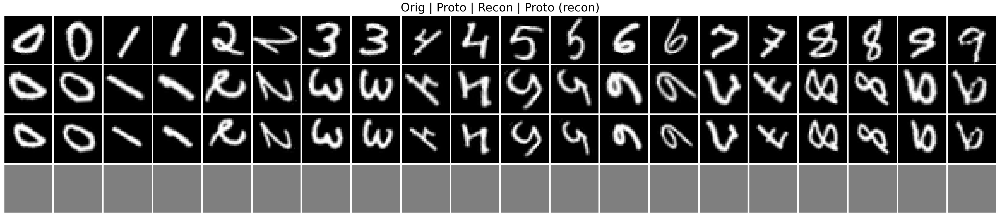

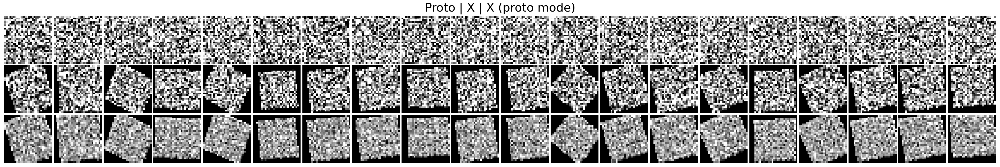

 23%|██▎       | 3499/15002 [05:17<07:29, 25.56it/s, Trn Loss 1283,	 Trn LL 68.79,	 Val Loss 1382,	 Val LL -16.54]  

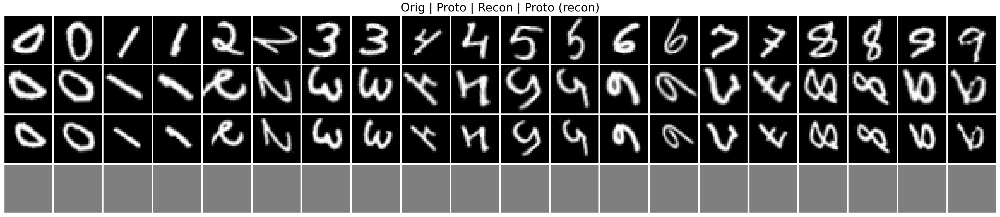

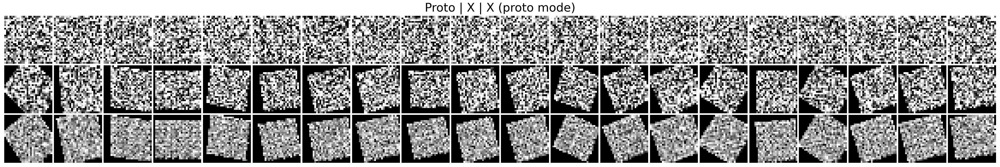

 27%|██▋       | 4000/15002 [05:46<07:05, 25.83it/s, Trn Loss 1268,	 Trn LL 92.46,	 Val Loss 1397,	 Val LL -41.44]  

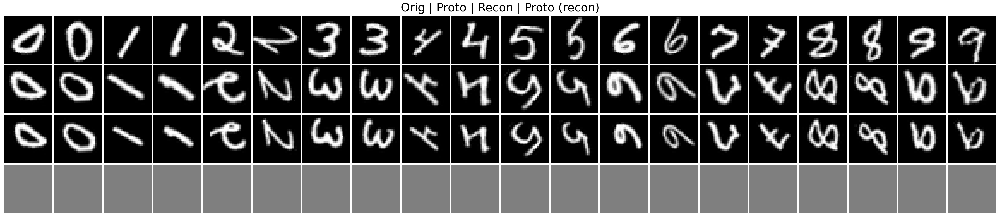

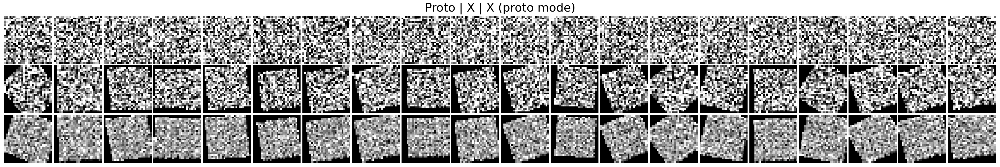

 30%|██▉       | 4498/15002 [06:17<06:47, 25.78it/s, Trn Loss 1265,	 Trn LL 90.94,	 Val Loss 1389,	 Val LL -23.48]  

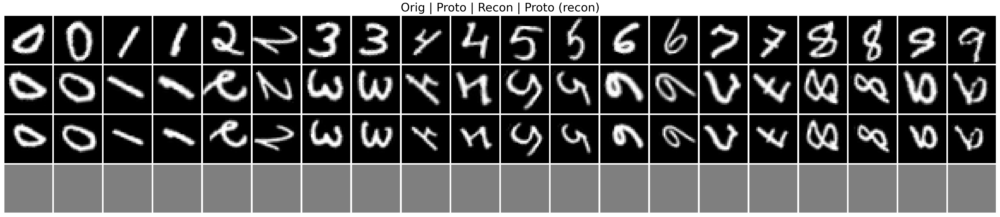

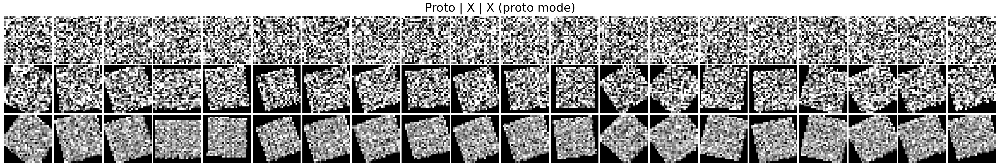

 33%|███▎      | 4999/15002 [06:49<19:17,  8.64it/s, Trn Loss 1243,	 Trn LL 101.1,	 Val Loss 1312,	 Val LL 47.82]   

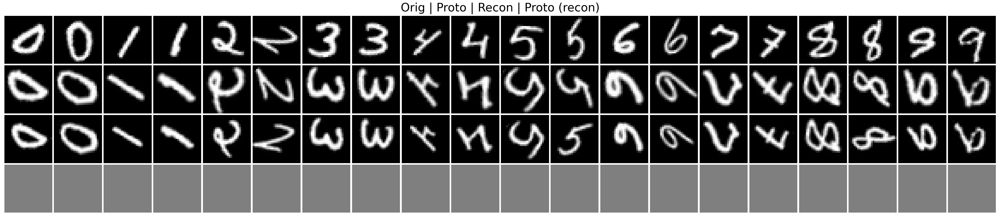

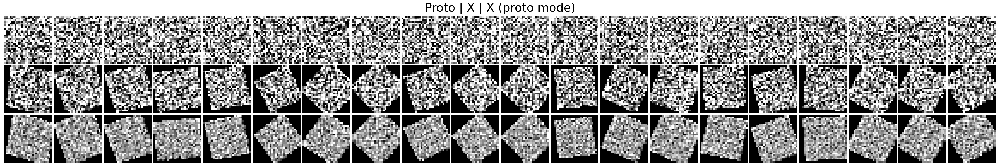

 37%|███▋      | 5499/15002 [07:19<11:08, 14.22it/s, Trn Loss 1251,	 Trn LL 96.53,	 Val Loss 1296,	 Val LL 50.28]  

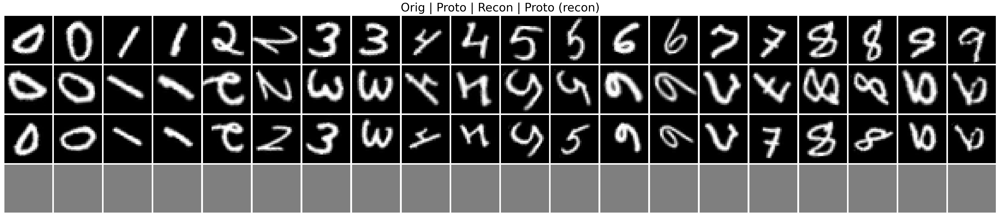

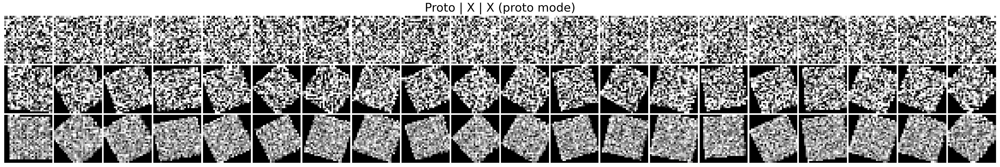

 40%|███▉      | 6000/15002 [07:51<06:31, 23.01it/s, Trn Loss 1202,	 Trn LL 151.8,	 Val Loss 1250,	 Val LL 106.1]  

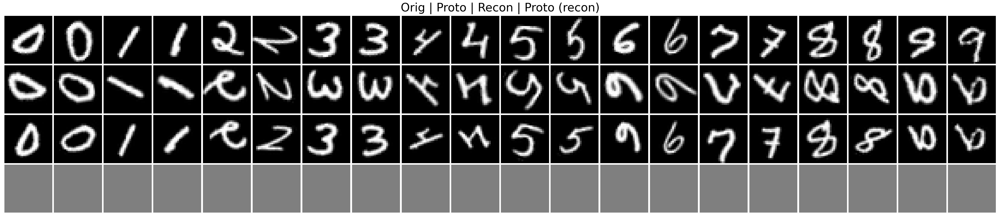

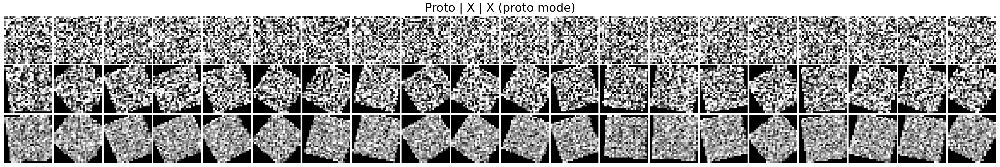

 43%|████▎     | 6498/15002 [08:22<06:11, 22.88it/s, Trn Loss 1250,	 Trn LL 112.3,	 Val Loss 1248,	 Val LL 114.2]  

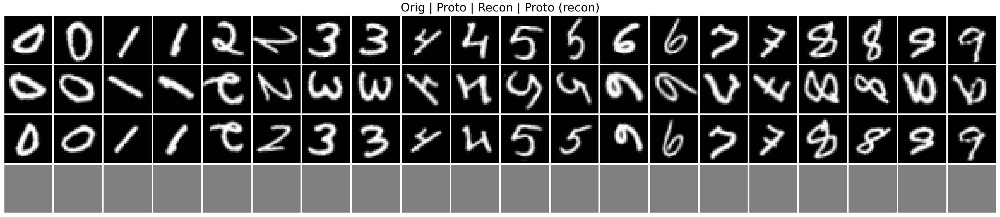

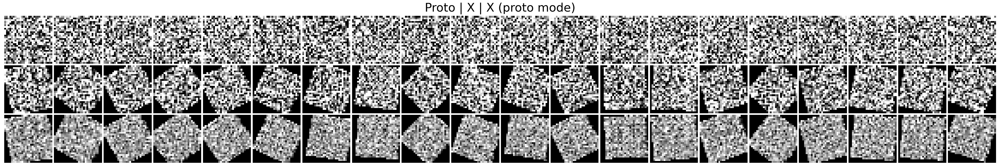

 47%|████▋     | 6999/15002 [08:54<04:54, 27.21it/s, Trn Loss 1212,	 Trn LL 145.4,	 Val Loss 1258,	 Val LL 108.4]  

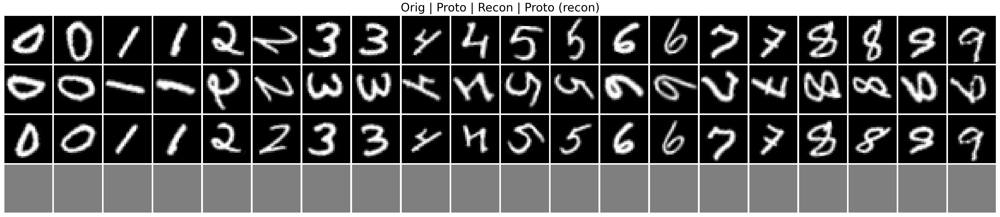

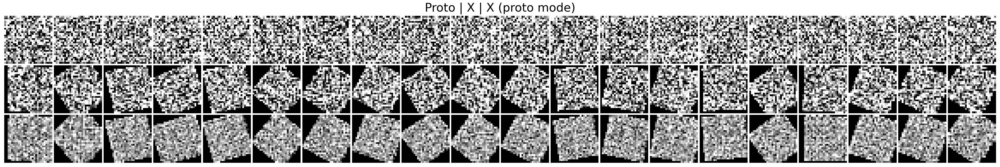

 50%|████▉     | 7500/15002 [09:24<04:43, 26.48it/s, Trn Loss 1192,	 Trn LL 167.8,	 Val Loss 1246,	 Val LL 116.6]  

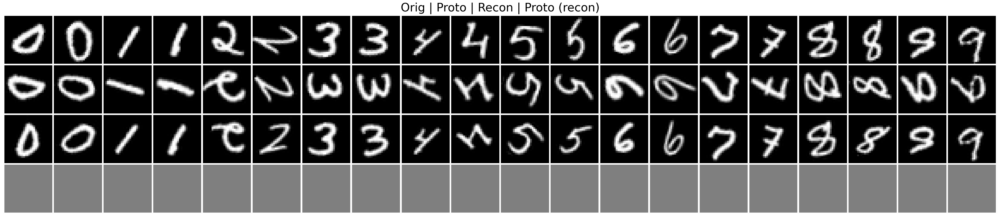

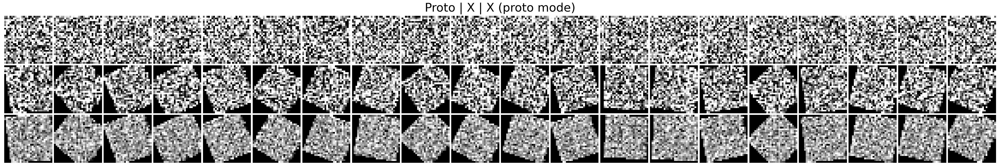

 50%|████▉     | 7500/15002 [09:31<04:43, 26.48it/s, Trn Loss 1200,	 Trn LL 161.2,	 Val Loss 1224,	 Val LL 140.8]INFO:absl:Initializing model...
INFO:absl:config.model_name = SSILVAE
INFO:absl:config.model = Xhat_given_Z:
  conv_dims: !!python/tuple
  - 256
  - 128
  - 64
  dense_dims: &id001 !!python/tuple
  - 256
  max_2strides: 2
Z_given_Xhat:
  conv_dims: !!python/tuple
  - 64
  - 128
  - 256
  dense_dims: *id001
  max_2strides: 2
bounds: !!python/tuple
- 0.25
- 0.25
- 3.141592653589793
- 0.25
- 0.25
latent_dim: 16
offset: !!python/tuple
- 0.0
- 0.0
- 0.0
- 0.0
- 0.0
"\u0397_given_X":
  base:
    conv_dims: !!python/tuple []
    dense_dims: &id002 !!python/tuple
    - 64
    - 32
    - 16
    dropout_rate: 0.0
  conditioner:
    dropout_rate: 0.0
    hidden_dims: &id003 !!python/tuple
    - 256
    - 128
  num_bins: 5
  num_layers: 1
  trunk:
    conv_dims: &id004 !!python/tuple
    - 32
    - 64
    - 128
    dense_dims: *id001
    dropout_rate: 0.0
"\u0397_given_Xhat":
  base:
  

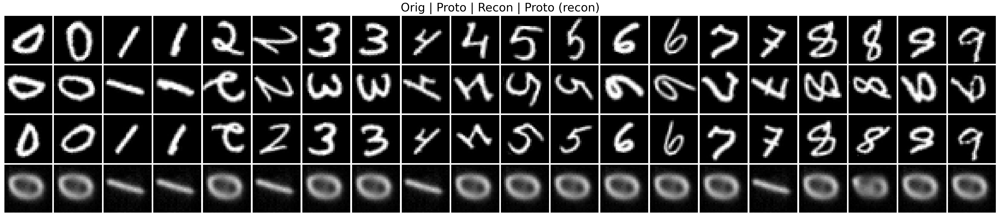

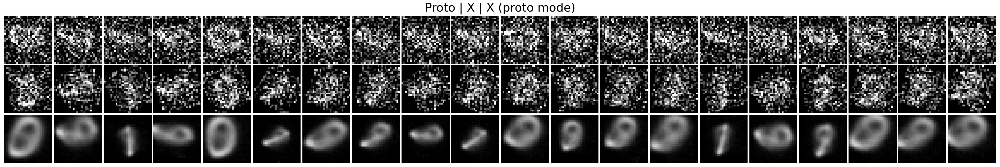

 57%|█████▋    | 8499/15002 [10:59<03:52, 28.01it/s, Trn Loss 402.3,	 Trn LL 157.7,	 Val Loss 620.5,	 Val LL 128.8]  

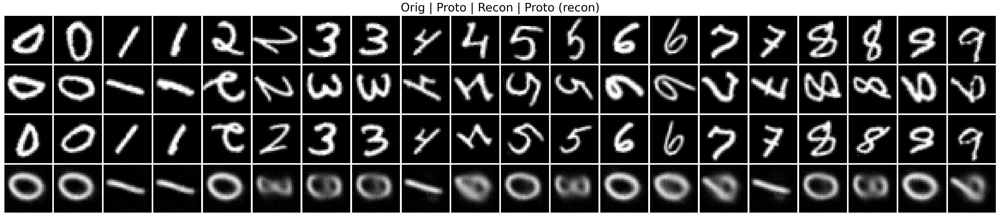

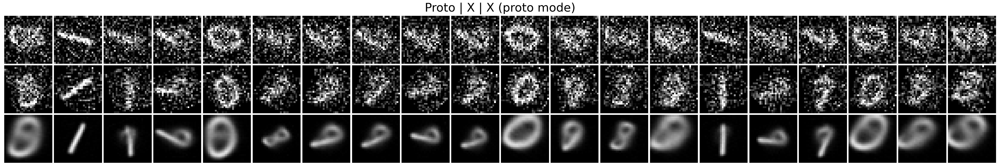

 60%|█████▉    | 9000/15002 [11:28<03:40, 27.28it/s, Trn Loss 189.3,	 Trn LL 165.7,	 Val Loss 432,	 Val LL 129.7]  

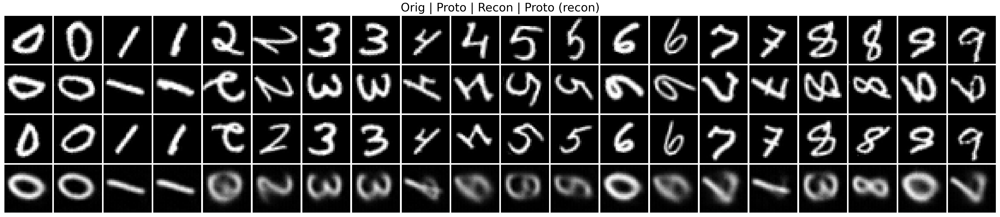

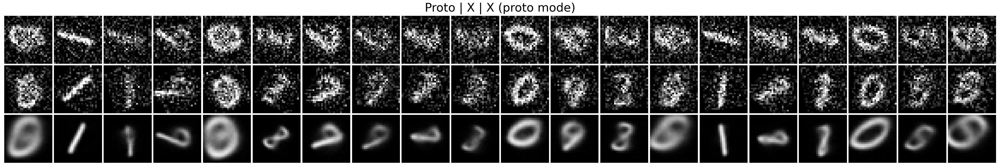

 63%|██████▎   | 9498/15002 [11:59<03:13, 28.39it/s, Trn Loss -7.678,	 Trn LL 177,	 Val Loss 237.6,	 Val LL 125.6]   

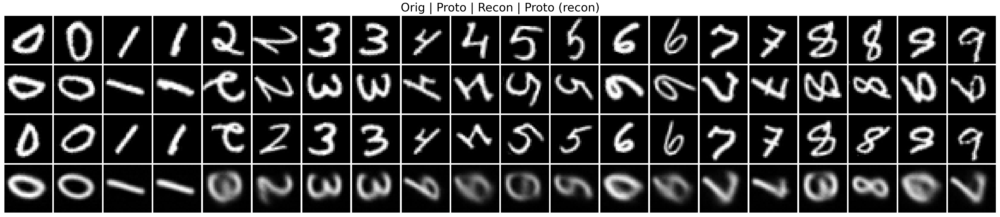

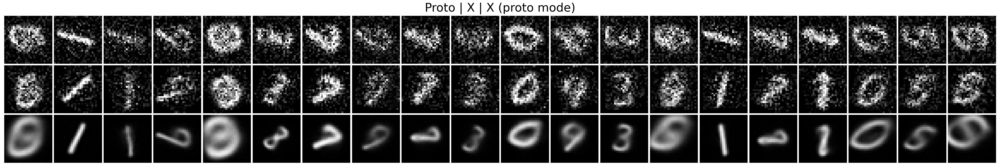

 67%|██████▋   | 9999/15002 [12:31<10:59,  7.59it/s, Trn Loss -151.3,	 Trn LL 179.4,	 Val Loss 63.6,	 Val LL 118.2]  

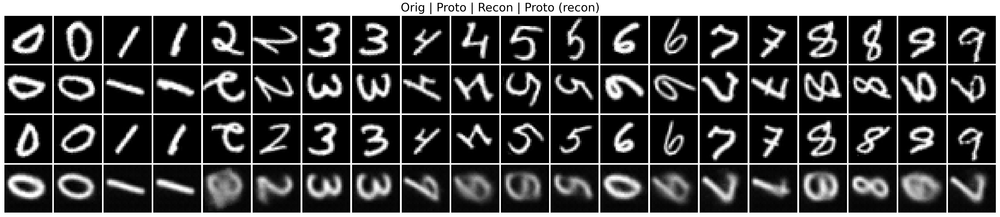

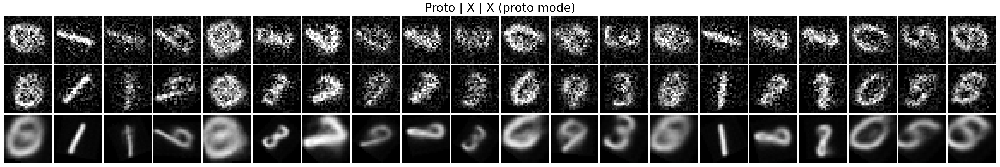

 70%|██████▉   | 10499/15002 [13:02<04:35, 16.35it/s, Trn Loss -274.1,	 Trn LL 182.8,	 Val Loss -57.42,	 Val LL 123.6]  

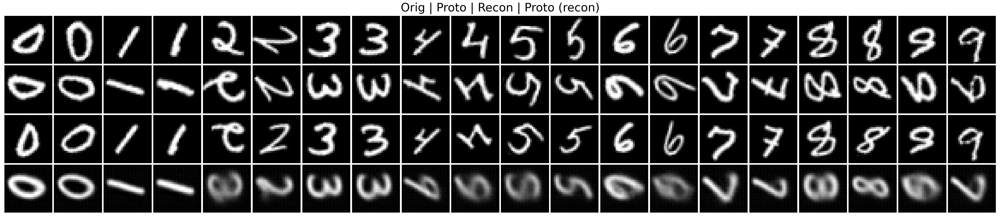

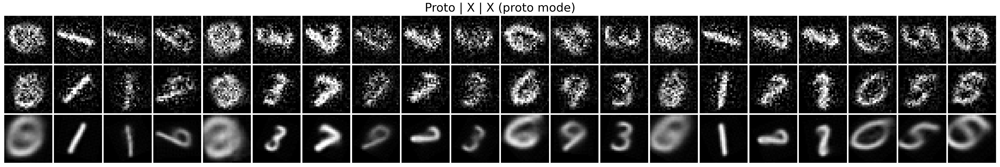

 73%|███████▎  | 11000/15002 [13:32<02:53, 23.08it/s, Trn Loss -341.2,	 Trn LL 164,	 Val Loss -210.7,	 Val LL 132.1]    

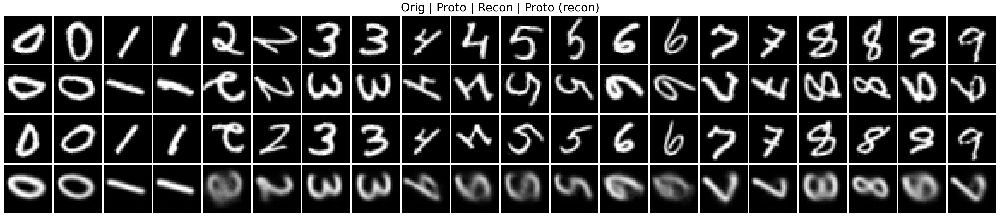

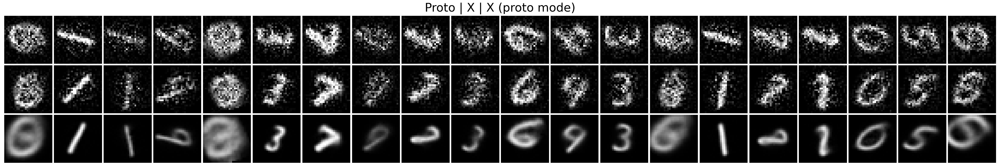

 77%|███████▋  | 11498/15002 [14:03<02:13, 26.18it/s, Trn Loss -435,	 Trn LL 148.7,	 Val Loss -326.6,	 Val LL 129.8]  

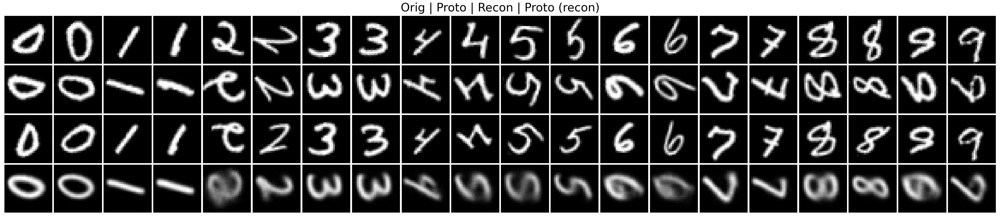

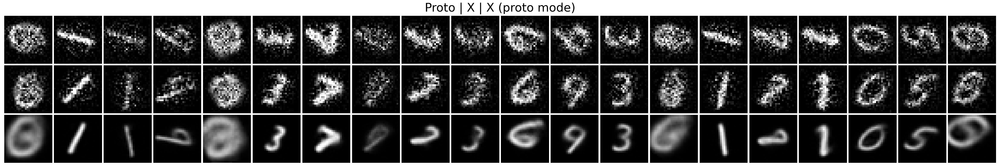

 80%|███████▉  | 11999/15002 [14:34<01:46, 28.33it/s, Trn Loss -490.6,	 Trn LL 146.7,	 Val Loss -396.9,	 Val LL 130.3]

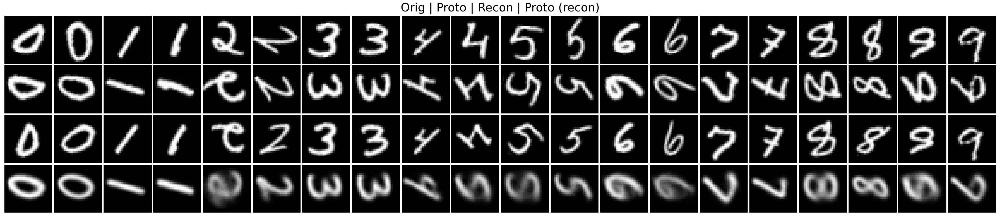

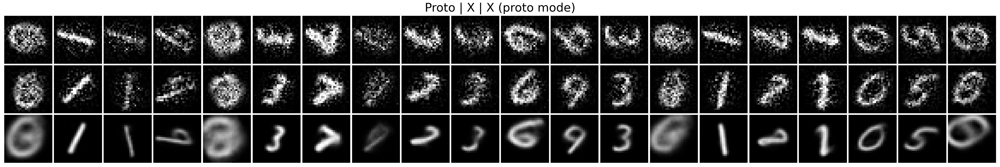

 83%|████████▎ | 12500/15002 [15:04<01:31, 27.43it/s, Trn Loss -517.3,	 Trn LL 152.8,	 Val Loss -465.6,	 Val LL 135.1]

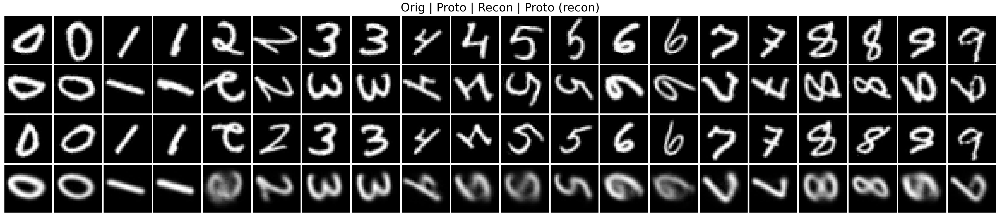

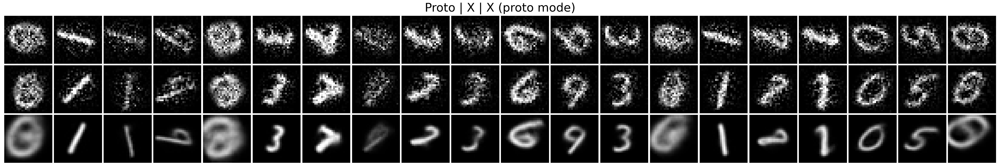

 87%|████████▋ | 12998/15002 [15:35<01:14, 26.99it/s, Trn Loss -528.2,	 Trn LL 156.1,	 Val Loss -506.8,	 Val LL 127]  

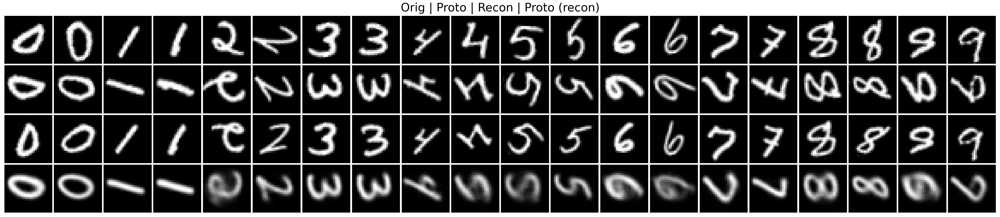

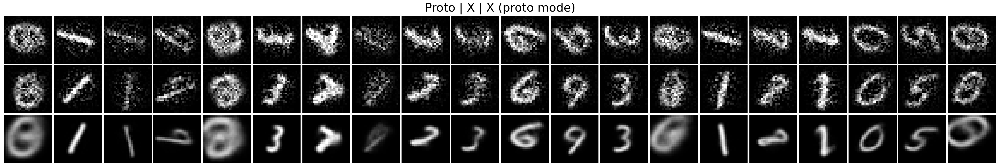

 90%|████████▉ | 13499/15002 [16:06<00:53, 28.09it/s, Trn Loss -565.8,	 Trn LL 128,	 Val Loss -543.9,	 Val LL 131.7]  

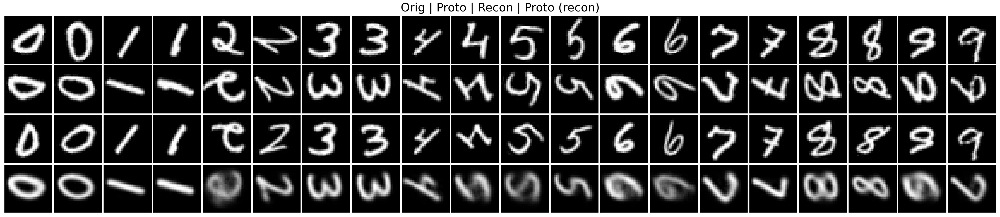

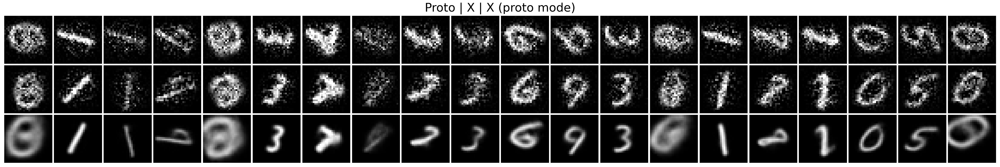

 93%|█████████▎| 13998/15002 [16:36<00:38, 26.04it/s, Trn Loss -635.8,	 Trn LL 179.7,	 Val Loss -573.8,	 Val LL 129.8]

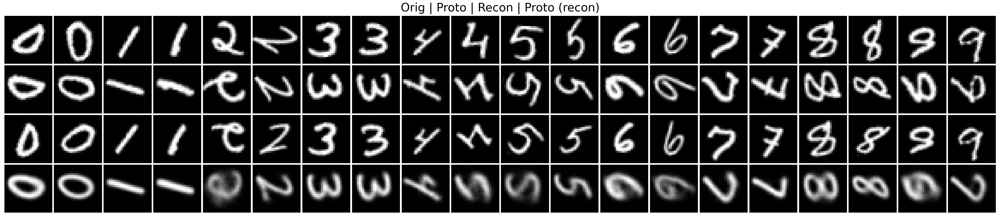

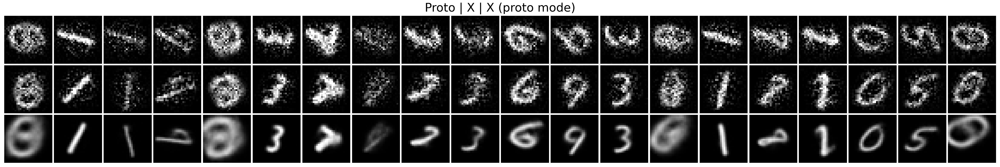

 97%|█████████▋| 14499/15002 [17:07<00:18, 27.51it/s, Trn Loss -576.5,	 Trn LL 132.7,	 Val Loss -586.2,	 Val LL 137.7]

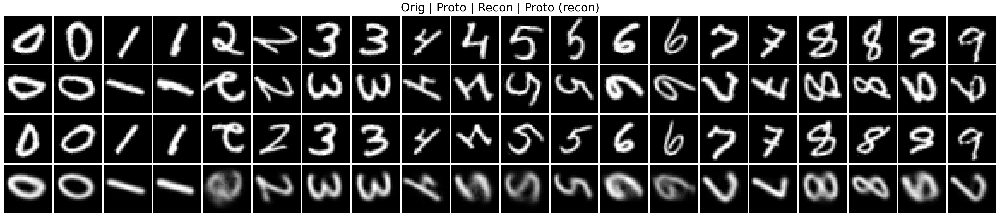

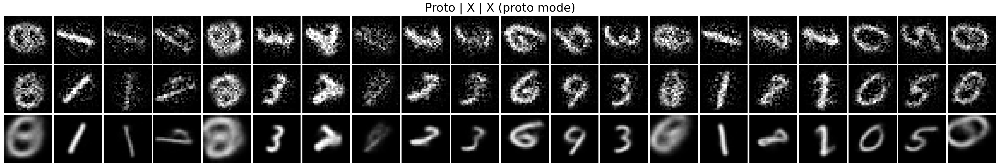

100%|█████████▉| 15000/15002 [17:39<00:00,  8.90it/s, Trn Loss -688.3,	 Trn LL 180.6,	 Val Loss -611.5,	 Val LL 141.5]

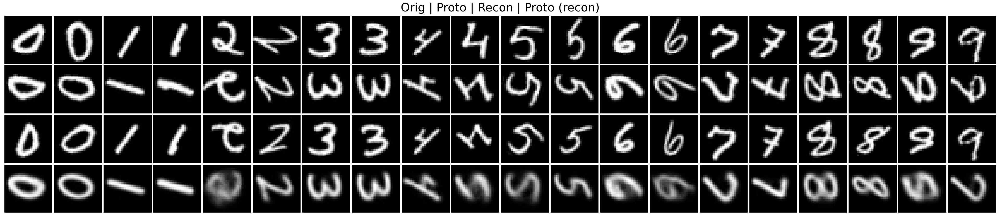

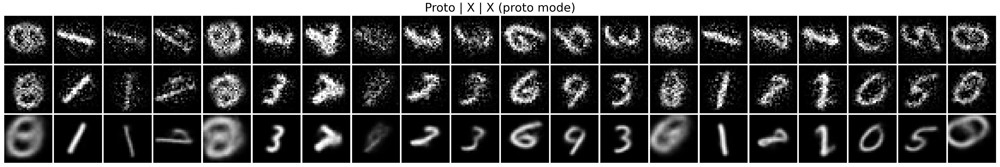

100%|██████████| 15002/15002 [17:46<00:00, 14.06it/s, Trn Loss -621.2,	 Trn LL 160.2,	 Val Loss -621.9,	 Val LL 140.5]
INFO:absl:Training finished.


learing_rate,▃▅████▇▇▆▆▅▅▄▃▃▂▂▂▂▁▂▃▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
train/elbo,▁▁▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▅▆▆▆▇▇▇▇██████████
train/ll,▁▂▄▆▇▇▇▇▇▇▇▇▇███████████████████████████
train/ll_unorm,▁▂▄▆▇▇▇▇▇▇▇▇▇███████████████████████████
train/loss,██▇▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train/p_q_H_cent,▇▄▃▃▁█▇▇▅▆▅▅▆▄▃▃▃▂▃▂▁▂▂▂▁▁▁▁▂▂▂▁▂▁▂▁▂▁▂▂
train/p_η_ce,▁▁▁▁▁▃▂▃▃▃▃▄▄▅▆▇▇█▆█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
train/q_H_ent,█▇▄▃▃▃▂▃▂▅▂▃▂▃▂▁▂▁▂▂▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train/q_η_ce,▁▁▁▁▁█▇▇▇▇▇█▇▇▇▇▇▇▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
train/xhat_ll,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▄▅▅▆▆▇▇▇▇▇████████
train/xhat_ll_unorm,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▄▅▅▆▆▇▇▇▇▇████████


In [8]:
best_state, final_state = train_loop(
    config,
    model,
    state,
    train_ds,
    val_ds,
    wandb_kwargs={
        'mode': 'offline',
        'tags': ['test', 'ssilvae', 'mnist'], 
        'notes': (
            'Testing SSILVAE training with new config. '
        )
    }
);


In [9]:
if RUN_EXTRA:
    pass
else:
    raise RuntimeError("Set RUN_EXTRA to True to keep running NB.")

RuntimeError: Set RUN_EXTRA to True to keep running NB.

## Make rotation plots

In [ ]:
from src.utils import input as input_utils
from src.models.ssil import make_summary_plot
from src.transformations.affine import transform_image
from src.models.common import (
    Flow,
    approximate_mode,
)
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
import jax
import distrax


summary_rng = random.PRNGKey(0)

[autoreload of src.utils.training failed: Traceback (most recent call last):
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    ref.__class__ = new
  File "<string>", line 4, in __setattr__
dataclasses.FrozenInstanceError: cannot assign to field '__class__'
]


### Make plot

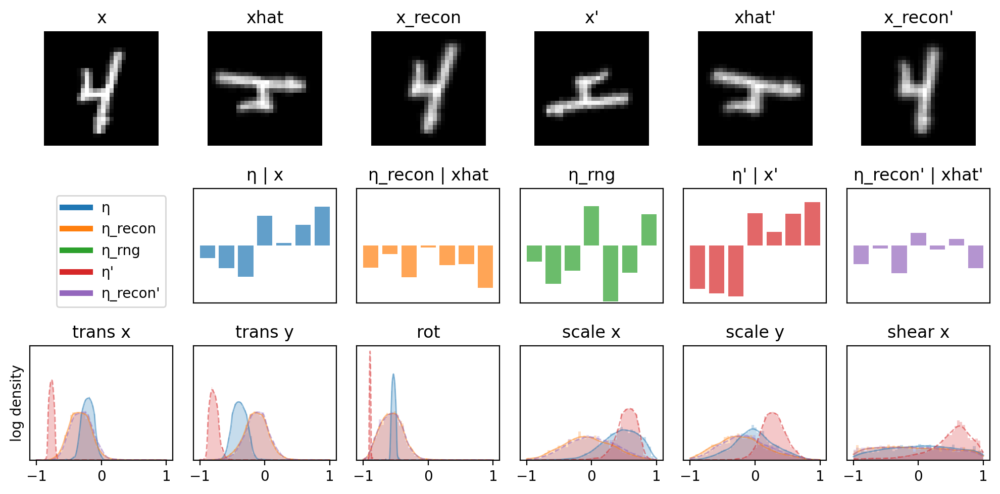

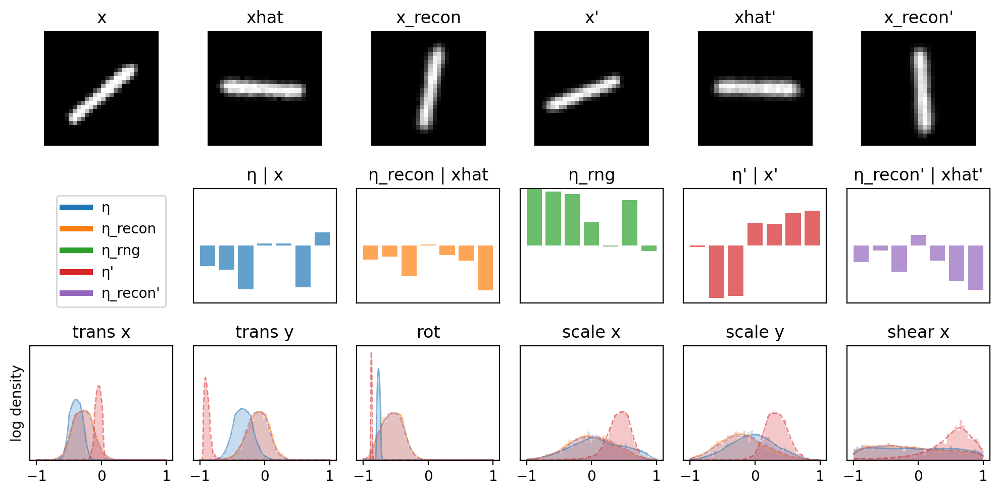

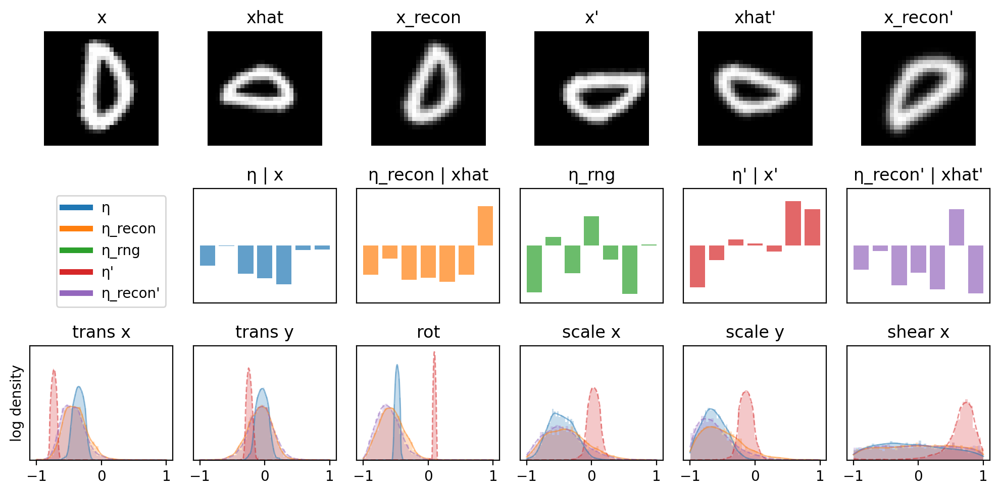

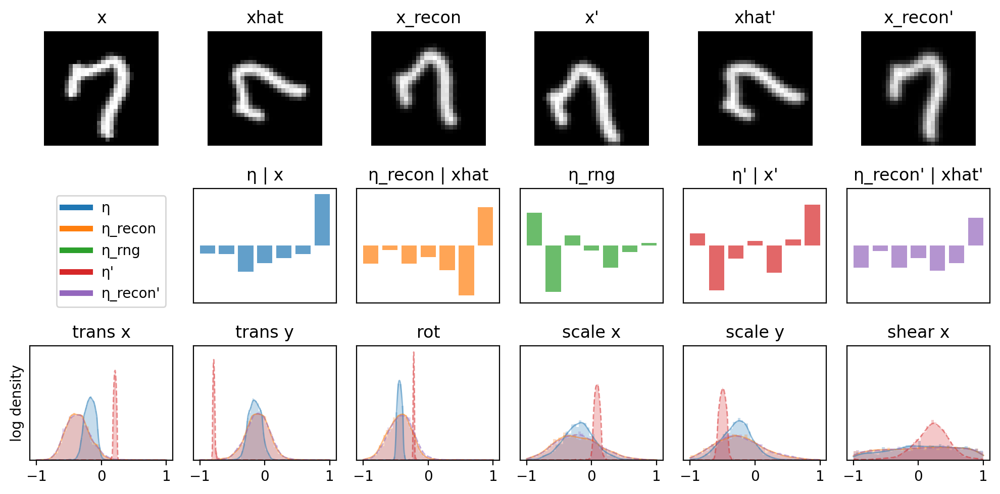

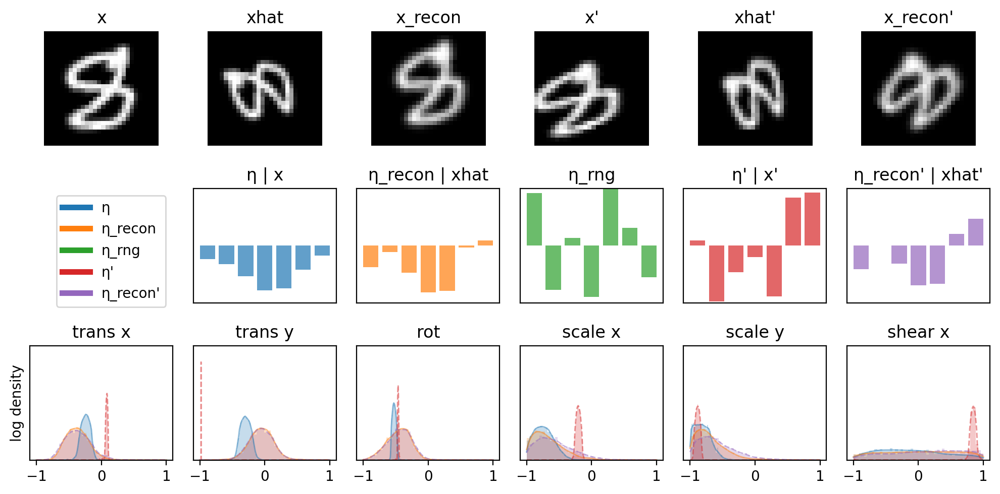

In [ ]:
for i, x in enumerate(val_batch['image'][0][:5]):
    tmp_rng, summary_rng = jax.random.split(summary_rng)
    make_summary_plot(config, final_state, x, tmp_rng)

### Investigate Distributions

In [ ]:
def make_dist_plots(dist, rng, color='C0'):
    samples, _ = dist.sample_and_log_prob(seed=rng, sample_shape=(3000,))
    samples = samples / jnp.array(config.model.bounds)
    _, num_dims = samples.shape

    fig, axs = plt.subplots(1, num_dims, figsize=(20, 4), dpi=400, sharey=True)

    for i in range(num_dims):
        axs[i].hist(samples[:, i], bins=50, density=True, color=color, alpha=0.5)
        # plot a gaussian KDE over the histogram
        x = jnp.linspace(-1, 1, 1000)
        kde = gaussian_kde(samples[:, i])
        axs[i].plot(x, kde(x), color=color)

    fig.tight_layout()
    fig.show()


In [ ]:
η, η_, p_X_given_xhat_and_η, p_Η_given_xhat, q_Η_given_x = model.apply(
    {"params": final_state.params},
    x,
    rng,
    1.0,
    train=False
)


In [ ]:
final_state.params['σ_']

ShardedDeviceArray(0.38065583, dtype=float32)

In [ ]:
p_X_given_xhat_and_η.log_prob(x)

DeviceArray(-752.90405, dtype=float32)

-673.692


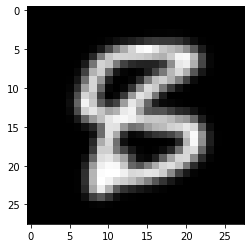

In [ ]:
x_rot = transform_image(x, jnp.array([0, 0, jnp.pi, 0, 0, 0, 0]))
plt.imshow(x_rot, cmap='gray')
print(p_X_given_xhat_and_η.log_prob(x_rot))

-786.0011


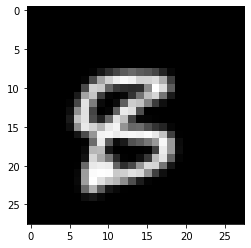

In [ ]:
x_trans = transform_image(x, jnp.array([0.25, 0.25, jnp.pi, 0.25, 0.25, 0, 0]))
plt.imshow(x_trans, cmap='gray')
print(p_X_given_xhat_and_η.log_prob(x_trans))

In [ ]:
η = approximate_mode(q_Η_given_x, 100, rng)
η

DeviceArray([-0.05048791, -0.07518937, -1.6429071 , -0.18842126,
             -0.2245992 , -0.01341782,  0.00817552], dtype=float32)

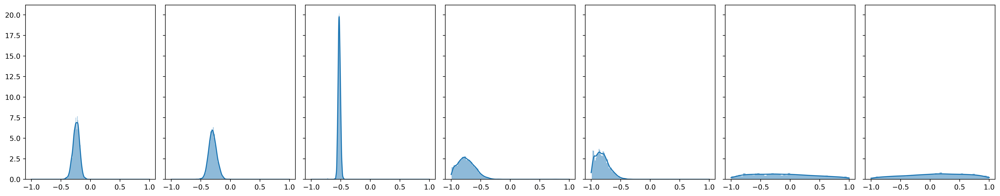

In [ ]:
make_dist_plots(q_Η_given_x, rng)

In [ ]:
q_Η_given_x.log_prob(η)

DeviceArray(18.315418, dtype=float32)

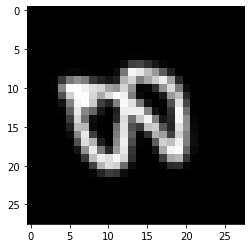

In [ ]:
x_hat = transform_image(x, -η)
plt.imshow(x_hat, cmap='gray')

In [ ]:
η2 = approximate_mode(p_Η_given_xhat, 1000, rng)
η2

DeviceArray([-0.11624698, -0.03274662, -1.7531292 , -0.24303898,
             -0.20750642,  0.02477482, -0.02615862], dtype=float32)

In [ ]:
p_Η_given_xhat.log_prob(η2)

DeviceArray(13.689987, dtype=float32)

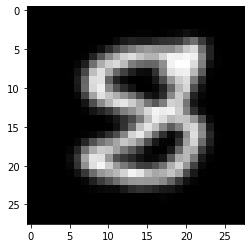

In [ ]:
x_rec = transform_image(x_hat, η2)
plt.imshow(x_rec, cmap='gray')

In [ ]:
q_Η_given_x.event_shape

JaxTransformError: Jax transforms and Flax models cannot be mixed. (https://flax.readthedocs.io/en/latest/flax.errors.html#flax.errors.JaxTransformError)